<a href="https://colab.research.google.com/github/sam002696/yolov5_project_code/blob/main/Code_yolov5_traffic_sign_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *Install All Modules Of Python Packages*


In [ ]:
!python -m pip install --upgrade pip

# Install specific versions of TensorFlow and TensorBoard
!pip install tensorflow==2.16.1
!pip install tensorboard==2.16.2
!pip install protobuf==4.25.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 14.2 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 107.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 66.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 88.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 117.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 31.6 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h

In [ ]:
import torch

In [ ]:
from IPython.display import Image

In [ ]:
from google.colab import drive

# Connect Google Drive

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd '/content/drive/My Drive/image_detection'

/content/drive/My Drive/image_detection


# Clone Yolov5 Module

In [ ]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [ ]:
%cd '/content/drive/My Drive/image_detection/image_yolov5/yolov5'

/content/drive/My Drive/image_detection/image_yolov5/yolov5


# Training & Validation Datasets

In [ ]:
import os
from random import choice
import shutil

#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath = '/content/drive/My Drive/image_detection/image_yolov5/dataset/images/train'
valPath = '/content/drive/My Drive/image_detection/image_yolov5/dataset/images/val'
crsPath = '/content/drive/MyDrive/image_detection/image_yolov5/data/ts'
#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)

training images are :  592
Validation images are :  148


In [ ]:
import os
# Define paths
trainimagePath = '/content/drive/My Drive/image_detection/image_yolov5/dataset/images/train'
trainlabelPath = '/content/drive/My Drive/image_detection/image_yolov5/dataset/labels/train'
valimagePath = '/content/drive/My Drive/image_detection/image_yolov5/dataset/images/val'
vallabelPath = '/content/drive/My Drive/image_detection/image_yolov5/dataset/labels/val'
crsPath = '/content/drive/MyDrive/image_detection/image_yolov5/data/ts'
valPath = '/content/drive/My Drive/image_detection/image_yolov5/dataset/images/val'

imgs = os.listdir(crsPath)
xmls = [img[:-4] + '.txt' for img in imgs] # corresponding annotation files

# Counts (update these with actual counts)
countForTrain = 100
countForVal = 20

# Cycle for train dir
for x in range(countForTrain):
    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] + '.txt' # get name of corresponding annotation file

    # Check if files exist before moving
    if not os.path.isfile(os.path.join(crsPath, fileJpg)):
        print(f"Image file not found: {fileJpg}")
        continue
    if not os.path.isfile(os.path.join(crsPath, fileXml)):
        print(f"Annotation file not found: {fileXml}")
        continue

    # Move both files into train dir
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))

    # Remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

# Cycle for test dir
for x in range(countForVal):
    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-4] + '.txt' # get name of corresponding annotation file

    # Check if files exist before moving
    if not os.path.isfile(os.path.join(crsPath, fileJpg)):
        print(f"Image file not found: {fileJpg}")
        continue
    if not os.path.isfile(os.path.join(crsPath, fileXml)):
        print(f"Annotation file not found: {fileXml}")
        continue

    # Move both files into val dir
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))

    # Remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

# Remove the destination directory if it already exists
if os.path.exists(valPath):
    shutil.rmtree(valPath)

# Move the remaining files to the val dir
shutil.move(crsPath, valPath)


'/content/drive/My Drive/image_detection/image_yolov5/dataset/images/val'

#Datasets Height & Weight Images

In [ ]:
import numpy as np
import cv2
# Image shape in Training
image = cv2.imread('/content/drive/MyDrive/image_detection/image_yolov5/dataset/images/train/00000.jpg')
height = np.size(image, 0)
width = np.size(image, 1)
print ("shape of the training image {}, {}".format(height, width))
# Image shape in validation
image = cv2.imread('/content/drive/MyDrive/image_detection/image_yolov5/dataset/images/val/00101.jpg')
height = np.size(image, 0)
width = np.size(image, 1)
print ("shape of the validation image {}, {}".format(height, width))

shape of the training image 800, 1360
shape of the validation image 800, 1360


# Traffic Sign Data.yaml

In [ ]:
%%writefile /content/drive/MyDrive/image_detection/yolov5/data/traffic_sign_data.yaml

train: /content/drive/MyDrive/image_detection/image_yolov5/dataset/images/train
val: /content/drive/MyDrive/image_detection/image_yolov5/dataset/images/val

# number of classes
nc: 4

# class names
names: ['speed limit', 'yield', 'mandatory', 'other']

Overwriting /content/drive/MyDrive/image_detection/yolov5/data/traffic_sign_data.yaml


# Training Datasets of the Model

In [ ]:
!python /content/drive/MyDrive/image_detection/yolov5/train.py --img 1376 --batch 16 --epochs 30 --data traffic_sign_data.yaml --weights yolov5s.pt --cache


train: weights=yolov5s.pt, cfg=, data=traffic_sign_data.yaml, hyp=../../yolov5/data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=1376, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=../../yolov5/data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=../../yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: ⚠️ YOLOv5 is out of date by 1 commit. Use 'git pull' or 'git clone https://github.com/ultralytics/yolov5' to update.
YOLOv5 🚀 v7.0-330-gb20fa802 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weigh

# TensorBoard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/image_detection/yolov5/runs

<IPython.core.display.Javascript object>

In [ ]:
from IPython.display import Image

# Traing Image Detection Display

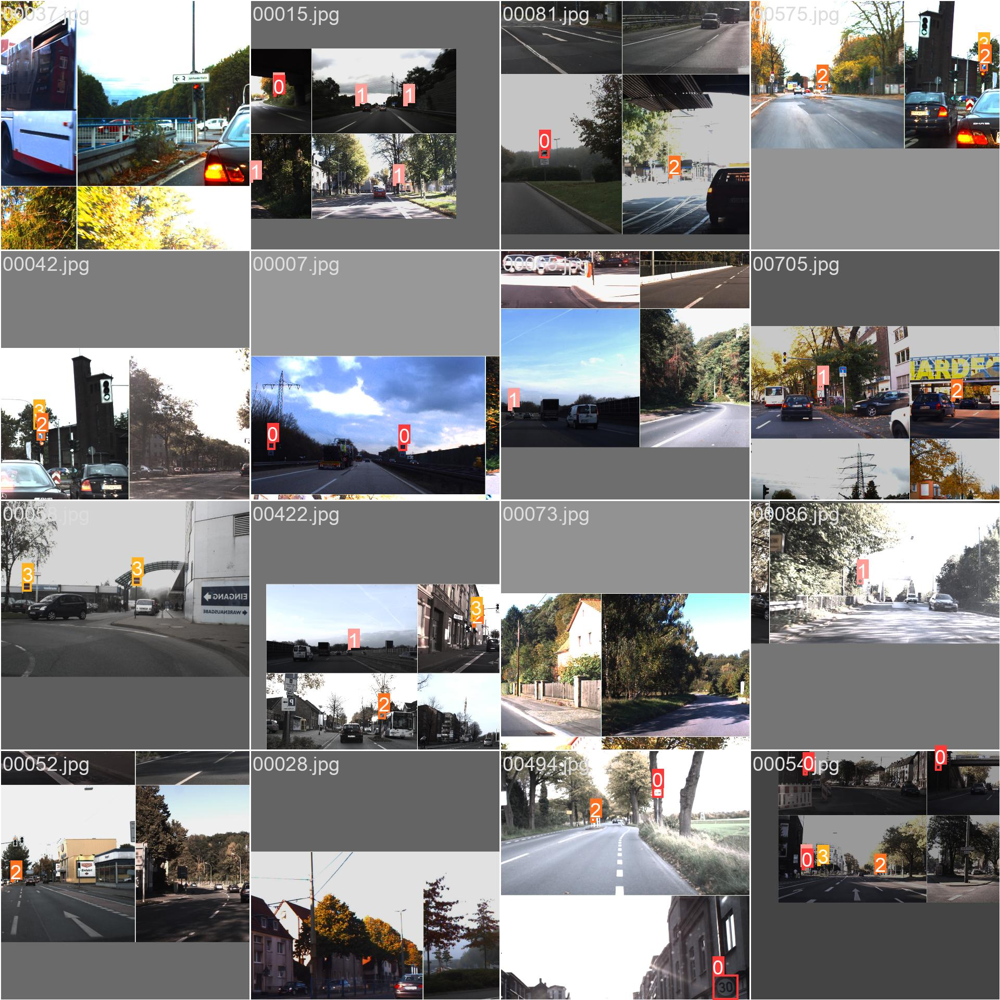

In [ ]:
Image(filename='/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/train_batch2.jpg', width=1000)

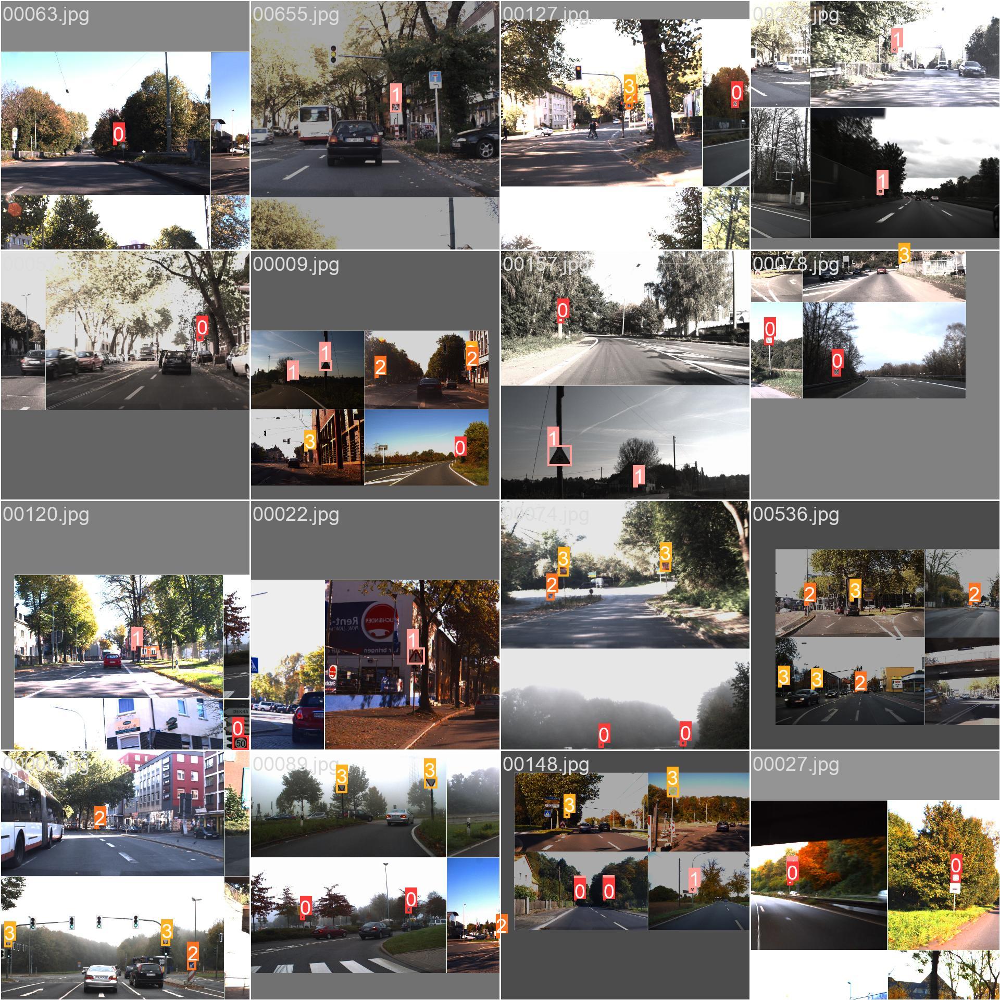

In [ ]:
Image(filename='/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/train_batch0.jpg', width=800)

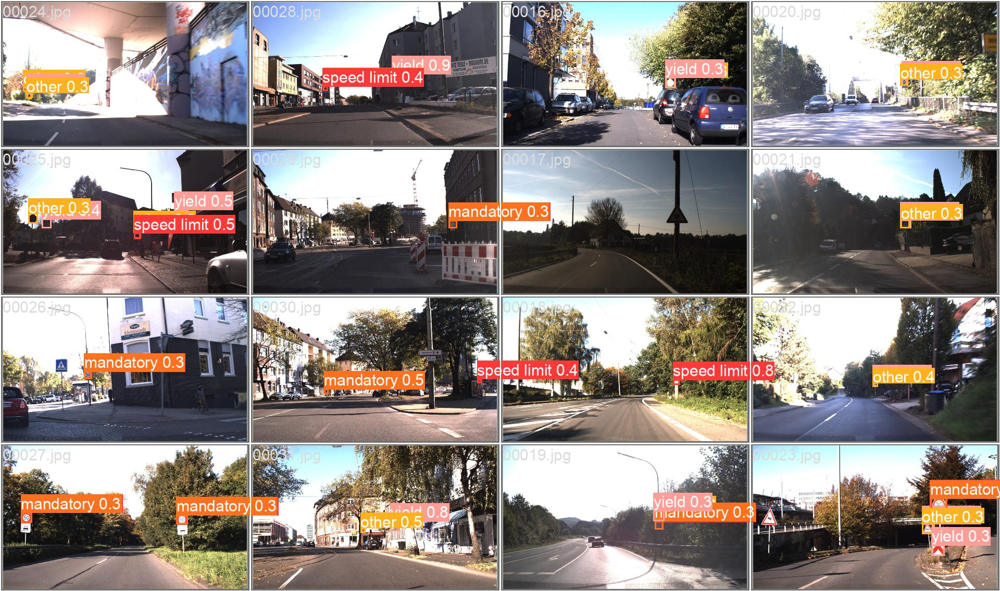

In [ ]:
Image(filename='/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/val_batch1_pred.jpg', width=800)

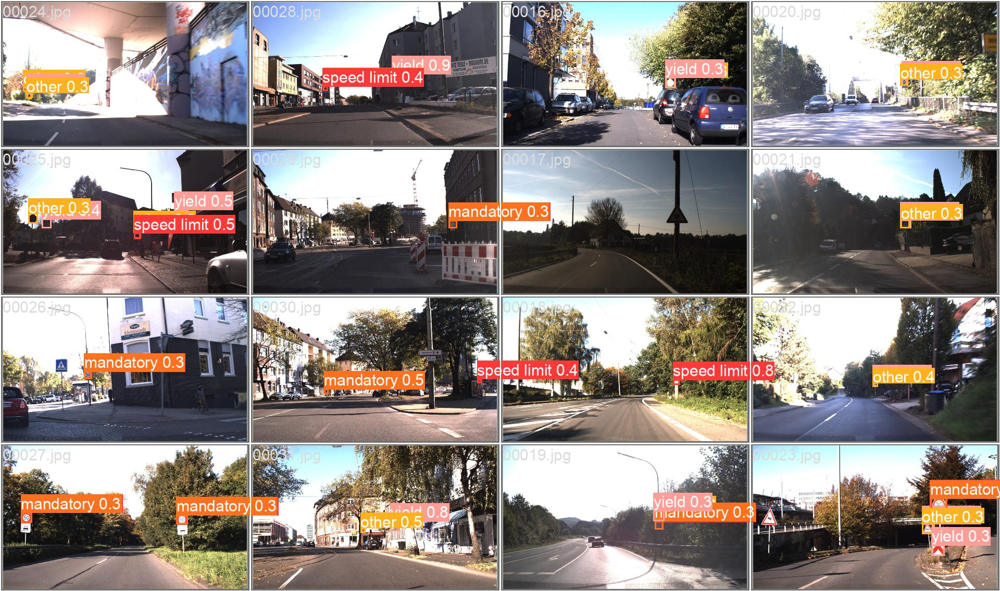

In [ ]:
Image(filename='/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/val_batch1_pred.jpg', width=800)

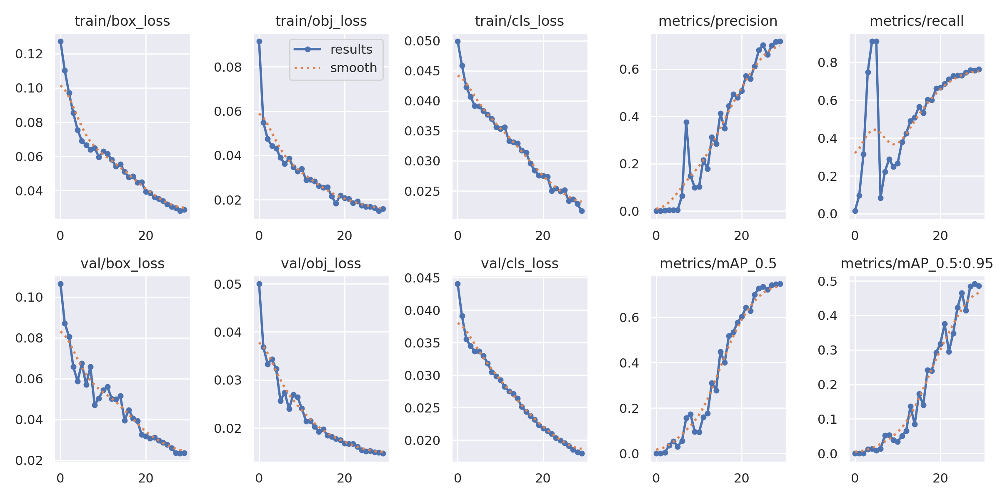

In [ ]:
Image(filename='/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/results.png', width=800)

Training Datasets Detection Model

In [ ]:
!python /content/drive/MyDrive/image_detection/yolov5/detect.py  --source /content/drive/MyDrive/image_detection/image_yolov5/dataset/images/val/00101.jpg --weights /content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/weights/best.pt --conf 0.25 --save-txt


detect: weights=['/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/weights/best.pt'], source=/content/drive/MyDrive/image_detection/image_yolov5/dataset/images/val/00101.jpg, data=../../yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../../yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-330-gb20fa802 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/drive/MyDrive/image_detection/image_yolov5/dataset/images/val/00101.jpg: 384x640 1 speed limit, 72.0ms
Speed: 0.6ms pre-process, 72.0ms

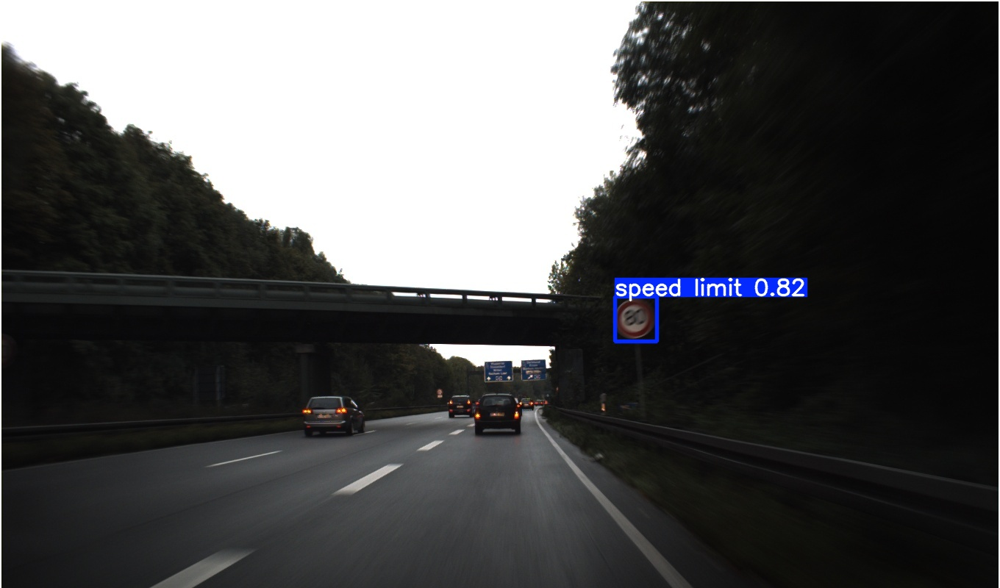

In [ ]:
Image(filename='/content/drive/MyDrive/image_detection/yolov5/runs/detect/exp7/00101.jpg', width=416)

# Video Datasets Detection

In [ ]:
!python /content/drive/MyDrive/image_detection/yolov5/detect.py  --source /content/drive/MyDrive/image_detection/image_yolov5/dataset/traffic-sign-to-test.mp4 --weights /content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/weights/best.pt --conf 0.25 --save-txt


detect: weights=['/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/weights/best.pt'], source=/content/drive/MyDrive/image_detection/image_yolov5/dataset/traffic-sign-to-test.mp4, data=../../yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=../../yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-330-gb20fa802 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/56) /content/drive/MyDrive/image_detection/image_yolov5/dataset/traffic-sign-to-test.mp4: 384x640 1 speed limit, 46.6ms
video 1/1 (2/56) 

# Results & Performance Graphs

In [ ]:
import os
import matplotlib.pyplot as plt
import pandas as pd

# Path to the results file
results_dir = '/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8'
results_csv = os.path.join(results_dir, 'results.csv')

# Load the results
results = pd.read_csv(results_csv)

# Display the first few rows and column names to understand the structure
print(results.head())
#print(results.columns)

                  epoch        train/box_loss        train/obj_loss  \
0                     0              0.127200              0.091543   
1                     1              0.110180              0.054936   
2                     2              0.096991              0.047456   
3                     3              0.085313              0.044274   
4                     4              0.075497              0.043249   

         train/cls_loss     metrics/precision        metrics/recall  \
0              0.049896              0.000160               0.01474   
1              0.045845              0.001058               0.09592   
2              0.042303              0.002227               0.31386   
3              0.040648              0.003745               0.74891   
4              0.039172              0.004522               0.91075   

        metrics/mAP_0.5  metrics/mAP_0.5:0.95          val/box_loss  \
0              0.000082              0.000016              0.106520   
1   

In [ ]:
from IPython.display import Image

# Label Of the Datasets Measurement

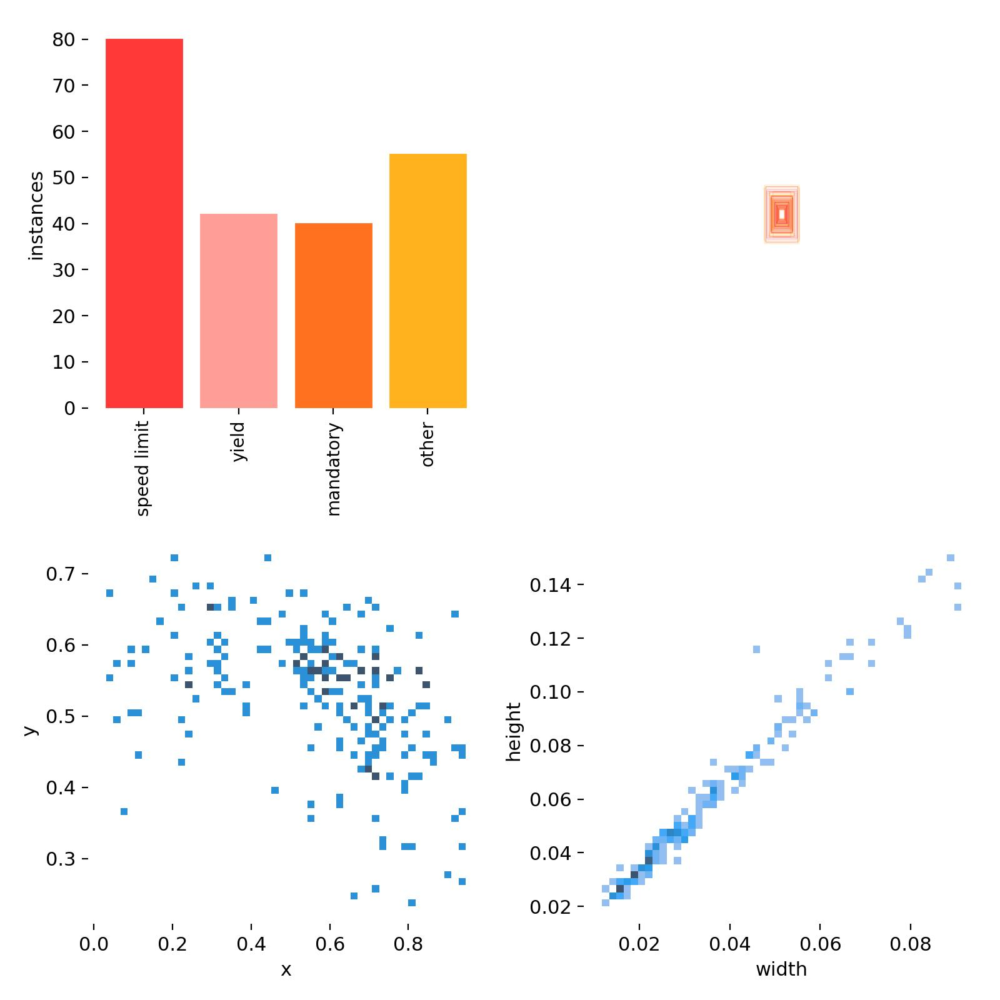

In [ ]:
Image(filename='/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8/labels.jpg', width=416)

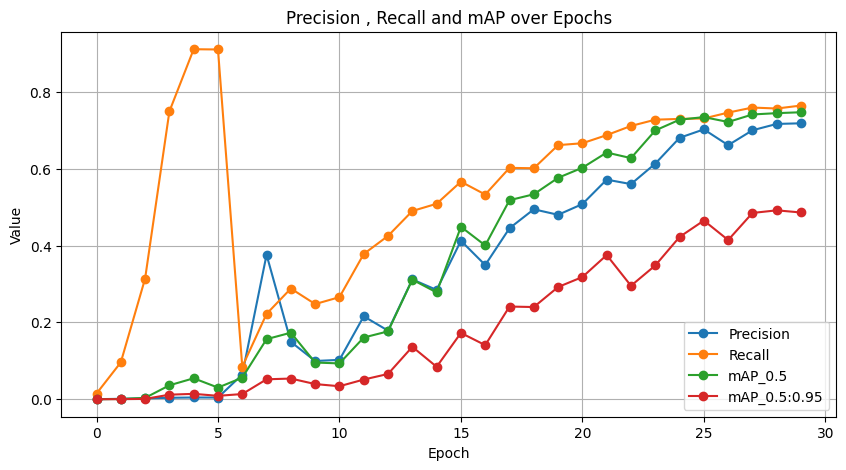

In [ ]:
import os
import matplotlib.pyplot as plt
import pandas as pd

# Path to the results file
results_dir = '/content/drive/MyDrive/image_detection/yolov5/runs/train/exp8'
results_csv = os.path.join(results_dir, 'results.csv')

# Load the results
results = pd.read_csv(results_csv)

# Clean the column names
results.columns = results.columns.str.strip()

# Plot precision and recall
plt.figure(figsize=(10, 5))

# Plot precision
plt.plot(results['epoch'], results['metrics/precision'], label='Precision', marker='o')

# Plot recall
plt.plot(results['epoch'], results['metrics/recall'], label='Recall', marker='o')

# Plot mAP
plt.plot(results['epoch'], results['metrics/mAP_0.5'], label='mAP_0.5', marker='o')
plt.plot(results['epoch'], results['metrics/mAP_0.5:0.95'], label='mAP_0.5:0.95', marker='o')


plt.xlabel('Epoch')
plt.ylabel('Value')
plt.title('Precision , Recall and mAP over Epochs')
plt.legend()
plt.grid(True)
plt.show()
